# Sample Run with DCtrVAE for Morpho-MNIST dataset

In [1]:
import os 
os.chdir("../")

In [2]:
import reptrvae
import scanpy as sc
import numpy as np
import matplotlib.pyplot as plt

Using TensorFlow backend.


In [3]:
condition_key = "condition"
label_key = "labels"
target_labels = [0, 2, 4, 5, 8, 9]
target_conditions = ["thin", 'thick']

In [ ]:
adata = sc.read("./data/thick_thin_mnist/thick_thin_mnist.h5ad")
adata

In [ ]:
adata.X /= 255.0

In [ ]:
adata.X.min(), adata.X.max()

In [ ]:
train_adata, valid_adata = reptrvae.utils.train_test_split(adata, 0.90)
train_adata.shape, valid_adata.shape

In [ ]:
net_train_adata = train_adata[~((train_adata.obs[condition_key].isin(target_conditions)) & (train_adata.obs[label_key].isin(target_labels)))]
net_valid_adata = valid_adata[~((valid_adata.obs[condition_key].isin(target_conditions)) & (valid_adata.obs[label_key].isin(target_labels)))]

In [ ]:
net_train_adata.shape, net_valid_adata.shape

In [ ]:
net_train_adata.obs.groupby([condition_key, label_key]).size()

In [ ]:
input_shape = (28, 28, 1)
n_conditions = len(net_train_adata.obs[condition_key].unique().tolist())

In [ ]:
network = reptrvae.models.DCtrVAE(x_dimension=input_shape,
                                  z_dimension=50,
                                  mmd_dimension=64,
                                  alpha=1e-3,
                                  beta=10,
                                  gamma=0.0,
                                  eta=10.,
                                  model_path="./models/DCtrVAE/thick_thin_mnist/",
                                  dropout_rate=0.3,
                                  arch_style=1,
                                  n_conditions=n_conditions,
                                  )

In [16]:
condition_encoder = {'normal': 0, 'thin': 1, 'thick': 2}

In [ ]:
network.train(net_train_adata, 
              net_valid_adata,
              condition_encoder,
              condition_key,
              n_epochs=10000,
              batch_size=512,
              early_stop_limit=250,
              lr_reducer=200, 
              shuffle=True, 
              save=True,
              verbose=2)

Train on 99123 samples, validate on 10989 samples
Epoch 1/10000
 - 16s - loss: 6.7189 - kl_reconstruction_loss: 6.1574 - mmd_loss: 0.5615 - val_loss: 4.9122 - val_kl_reconstruction_loss: 4.1616 - val_mmd_loss: 0.7506
Epoch 2/10000
 - 13s - loss: 4.7917 - kl_reconstruction_loss: 4.2859 - mmd_loss: 0.5058 - val_loss: 3.9522 - val_kl_reconstruction_loss: 3.3585 - val_mmd_loss: 0.5937
Epoch 3/10000
 - 13s - loss: 4.3462 - kl_reconstruction_loss: 3.8799 - mmd_loss: 0.4662 - val_loss: 3.9696 - val_kl_reconstruction_loss: 3.4056 - val_mmd_loss: 0.5639
Epoch 4/10000
 - 13s - loss: 4.0822 - kl_reconstruction_loss: 3.6411 - mmd_loss: 0.4411 - val_loss: 3.3464 - val_kl_reconstruction_loss: 2.8366 - val_mmd_loss: 0.5098
Epoch 5/10000
 - 13s - loss: 3.8432 - kl_reconstruction_loss: 3.4440 - mmd_loss: 0.3991 - val_loss: 2.6694 - val_kl_reconstruction_loss: 2.2230 - val_mmd_loss: 0.4464
Epoch 6/10000
 - 13s - loss: 3.6632 - kl_reconstruction_loss: 3.2919 - mmd_loss: 0.3713 - val_loss: 2.3839 - val_kl

In [31]:
digits_adata = adata[adata.obs[label_key].isin(target_labels)]
digits_adata

View of AnnData object with n_obs × n_vars = 104832 × 784 
    obs: 'batch', 'condition', 'labels'

In [33]:
digits = digits_adata.obs[label_key].unique().tolist()
digits

[5, 0, 4, 9, 2, 8]

# Out-of-Sample results visualization

In [39]:
path_to_save = f"./results/thick_thin_mnist/"
os.makedirs(path_to_save, exist_ok=True)
os.makedirs(os.path.join(path_to_save, f"normal_to_thick/"), exist_ok=True)
os.makedirs(os.path.join(path_to_save, f"normal_to_thin/"), exist_ok=True)

In [40]:
for i in range(30):
    for target_condition in target_conditions:
        plt.close("all")
        fig, ax = plt.subplots(len(digits), 3, figsize=(len(digits), 15))
        for idx, digit in enumerate(digits):
            digit_adata = digits_adata[digits_adata.obs[label_key] == digit]
            digit_adata_normal = digit_adata[digit_adata.obs[condition_key] == 'normal']
            digit_adata_target = digit_adata[digit_adata.obs[condition_key] == target_condition]

            digit_idx = np.random.choice(digit_adata_normal.shape[0], 1)[0]

            sample_digit_adata_normal = digit_adata_normal[digit_idx]
            sample_digit_adata_target = digit_adata_target[digit_idx]

            sample_digit_image_normal = np.reshape(sample_digit_adata_normal.X, (28, 28))
            sample_digit_image_target = np.reshape(sample_digit_adata_target.X, (28, 28))

            encoder_label = np.zeros((1, )) + condition_encoder['normal']
            decoder_label = np.zeros((1, )) + condition_encoder[target_condition]

            pred_adata = network.predict(sample_digit_adata_normal, encoder_label, decoder_label)
            pred_image = pred_adata.X.reshape((28, 28))

            ax[idx, 0].imshow(sample_digit_image_normal, cmap='Greys')
            ax[idx, 0].axis('off')
            ax[0, 0].set_title("Normal")

            ax[idx, 1].imshow(pred_image, cmap='Greys')
            ax[idx, 1].axis('off')
            ax[0, 1].set_title(f"Normal_to_{target_condition}")

            ax[idx, 2].imshow(sample_digit_image_target, cmap='Greys')
            ax[idx, 2].axis('off')
            ax[0, 2].set_title("Ground Truth")
        plt.savefig(os.path.join(path_to_save, f"normal_to_{target_condition}/sample_images_{i}.pdf"), dpi=200)
        plt.close('all')

In [41]:
sc.pp.neighbors(adata)
sc.tl.umap(adata)

         Falling back to preprocessing with `sc.pp.pca` and default params.


In [43]:
sc.set_figure_params(dpi=200)

/home/mohsen/.local/lib/python3.6/site-packages/matplotlib/font_manager.py:1241: UserWarning: findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.
  (prop.get_family(), self.defaultFamily[fontext]))


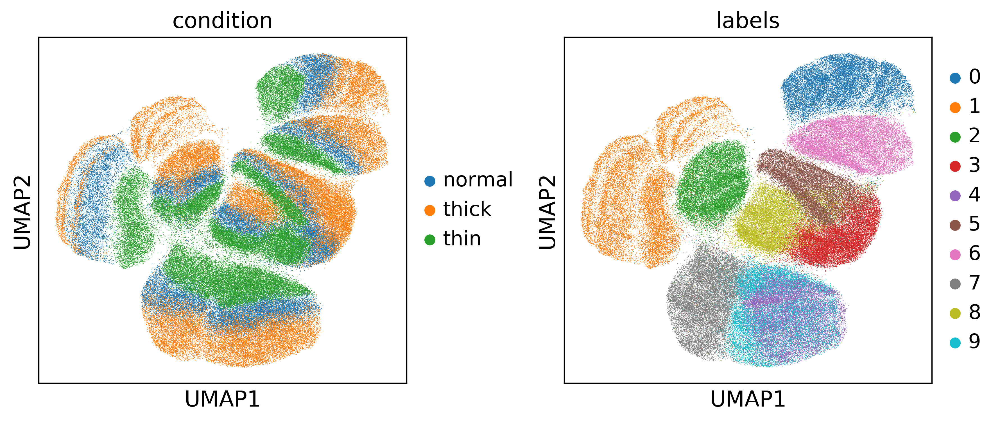

In [44]:
sc.pl.umap(adata, color=[condition_key, label_key], wspace=0.3)

In [21]:
encoder_labels, _ = reptrvae.utils.label_encoder(adata,
                                                 condition_key=condition_key, 
                                                 label_encoder=condition_encoder)
encoder_labels.shape

(180000, 1)

In [22]:
latent_adata = network.to_latent(adata, encoder_labels=encoder_labels)
latent_adata

AnnData object with n_obs × n_vars = 180000 × 50 
    obs: 'batch', 'condition', 'labels'

In [57]:
sc.pp.neighbors(latent_adata)
sc.tl.umap(latent_adata)

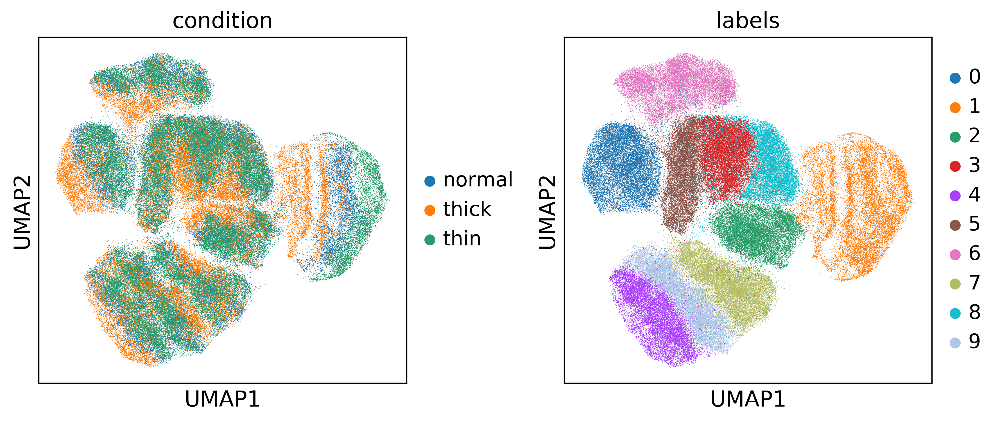

In [58]:
sc.pl.umap(latent_adata, color=[condition_key, label_key], wspace=0.3)

In [23]:
mmd_adata = network.to_mmd_layer(adata, encoder_labels, feed_fake=-1)
mmd_adata

AnnData object with n_obs × n_vars = 180000 × 64 
    obs: 'batch', 'condition', 'labels'

In [61]:
sc.pp.neighbors(mmd_adata)
sc.tl.umap(mmd_adata)

         Falling back to preprocessing with `sc.pp.pca` and default params.


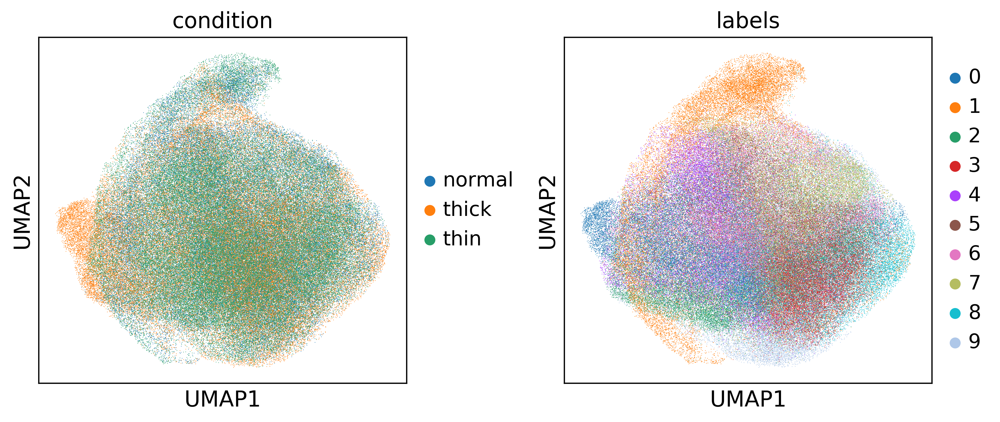

In [62]:
sc.pl.umap(mmd_adata, color=[condition_key, label_key], wspace=0.3)